## Importing Libraries

In [ ]:
!pip install pmdarima

In [ ]:
!pip install tbats

In [13]:
# Standard library imports
import os
import pickle

# Third-party library imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# Scikit-learn imports for preprocessing and model evaluation
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Statsmodels imports for time series analysis
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm

# Pmdarima imports for automated ARIMA modeling
from pmdarima import auto_arima
import pmdarima as pm

# TBATS model for time series forecasting
from tbats import TBATS
import plotly.graph_objects as go
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [14]:
import warnings
warnings.filterwarnings("ignore")


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [17]:
data = pd.read_csv('/content/expanded_dataset.csv')

In [ ]:
data.sample(5)

#### Convert  'Datetime' column to datetime

In [19]:
# data['Datetime'] = pd.to_datetime(data['Datetime'], format='%m/%d/%Y %H:%M', dayfirst=True)
data['Datetime'] = pd.to_datetime(data['Datetime'], format='%Y-%m-%d %H:%M:%S', errors='coerce')

In [20]:
data.set_index('Datetime', inplace=True)

In [21]:
data['TotalPowerConsumption']= data['PowerConsumption_Zone1'] + data['PowerConsumption_Zone2'] + data['PowerConsumption_Zone3']

In [22]:
data= data.drop(['PowerConsumption_Zone1','PowerConsumption_Zone2','PowerConsumption_Zone3'],axis=1)

# Data Preprocessing

In [ ]:
data.isnull().sum()

In [ ]:
data.tail()


In [ ]:
print('Index frequency:', pd.infer_freq(data.index))
print('Number of missing values:\n', data.isnull().sum())

In [26]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

def plot_numeric_boxplots(df, cols_per_row=3):
    """
    Create box plots for numeric columns in a DataFrame, arranged in multiple rows.

    Parameters:
        df (DataFrame): The input DataFrame.
        cols_per_row (int): Number of plots per row.

    Returns:
        None
    """

    # Select numeric columns
    numeric_cols = df.select_dtypes(include='number')
    num_cols = len(numeric_cols.columns)
    rows = (num_cols // cols_per_row) + (num_cols % cols_per_row > 0)

    # Create subplots
    fig = make_subplots(
        rows=rows, cols=cols_per_row,
        subplot_titles=numeric_cols.columns
    )

    # Add box plot traces
    for i, col in enumerate(numeric_cols.columns):
        row = (i // cols_per_row) + 1
        col_position = (i % cols_per_row) + 1
        fig.add_trace(
            go.Box(y=numeric_cols[col], name=col, boxmean=True),
            row=row, col=col_position
        )

    # Update layout
    fig.update_layout(
        height=rows * 400,  # Adjust height dynamically based on the number of rows
        width=cols_per_row * 200,
        title_text="Box Plots for Numeric Columns",
        showlegend=False,
        template="plotly_dark"
    )

    # Show the figure
    fig.show()

In [ ]:
plot_numeric_boxplots(data, cols_per_row=6)

Outlier Detection

In [28]:
RS = RobustScaler()

In [29]:
x = data.drop(['TotalPowerConsumption'],axis=1)
y = data['TotalPowerConsumption']


In [30]:
plot_numeric_boxplots(x, cols_per_row=5)

In [31]:
scaled_x = RS.fit_transform(x)

In [32]:
x= pd.DataFrame(scaled_x, columns=x.columns)

In [ ]:
plot_numeric_boxplots(x, cols_per_row=5)

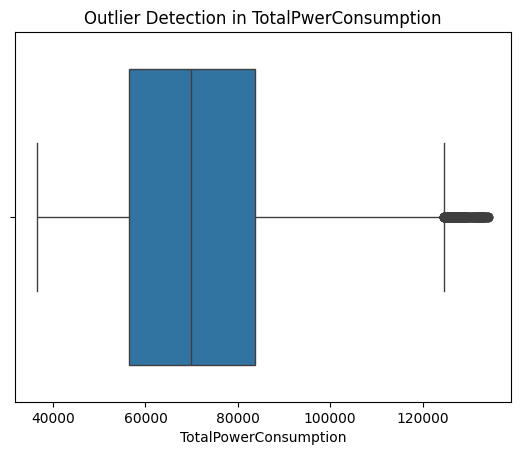

In [34]:
sns.boxplot(x='TotalPowerConsumption',data=data)
plt.title('Outlier Detection in TotalPwerConsumption')
plt.show()

Data Distribution correction

In [35]:
import plotly.figure_factory as ff
import plotly.graph_objects as go

def plot_distribution(data, column):
    """
    Plot the distribution of a specified column using Plotly.

    Parameters:
    data (DataFrame): The data containing the column.
    column (str): The column name to plot.
    """
    # Create distribution plot
    fig = ff.create_distplot(
        [data[column]], [column], show_hist=True, show_rug=True,
        colors=['#636EFA']  # Add color to the plot
    )

    # Update layout
    fig.update_layout(
        title=f'Distribution Plot of {column}',
        xaxis_title=column,
        yaxis_title='Density',
        width=1000,
        height=600,
        plot_bgcolor='white',  # Set background color to white
        paper_bgcolor='white',  # Set paper background color to white
        font=dict(color='black')  # Set font color to black
    )

    # Update x and y axis
    fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
    fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')

    fig.show()
    # print('trial')

# Example usage
# plot_distribution(data, 'TotalPowerConsumption')


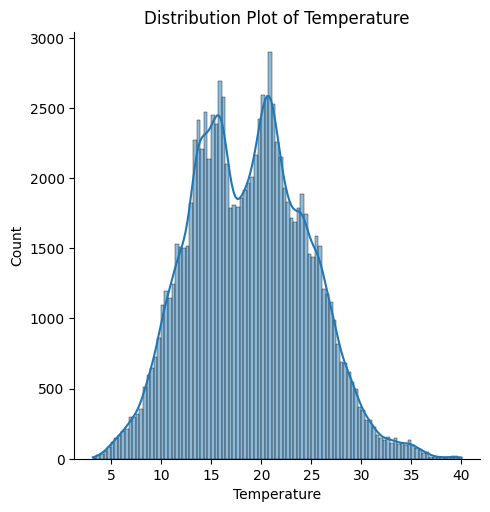

In [36]:
sns.displot(data['Temperature'], kde=True)
plt.title('Distribution Plot of Temperature')
plt.show()

In [37]:
data['Temperature'].skew()

0.19646588730575704

In [38]:
from scipy.stats import boxcox
data['Temperature'], lambda_boxcox = boxcox(data['Temperature'])

In [39]:
data['Temperature'].skew()

-0.029020062044293266

In [40]:
plot_distribution(data, 'Temperature')

You can check this distribution for every column to computational space, I will use total power consumption directly

In [41]:
data['TotalPowerConsumption'].skew()

0.518718528942386

In [42]:
data['TotalPowerConsumption'], lambda_boxcox = boxcox(data['TotalPowerConsumption'])

In [43]:
data['TotalPowerConsumption'].skew()

0.005384499300871414

In [ ]:
plot_numeric_boxplots(data, cols_per_row=3)

In [45]:
x= data.drop(['TotalPowerConsumption'],axis=1)
y=data['TotalPowerConsumption']

In [46]:
import plotly.graph_objects as go

# Filter the data for the specified date range
filtered_data = y['2018-12-01 00:00:00':]

# Create the figure
fig = go.Figure()

# Add the trace
fig.add_trace(go.Scatter(x=filtered_data.index, y=filtered_data, mode='lines', line=dict(color='red')))

# Update the layout
fig.update_layout(
    title='Total power consumption time series',
    xaxis_title='Datetime',
    yaxis_title='Power Consumption',
    width=1800,
    height=700
)

# Show the figure
fig.show()


This is basic data preprocessing, now will use two statistical test to check the stationarity of dataset for ml model prediction purpose

In [47]:
def adf_test(timeseries):
    print("Results of Dickey-Fuller Test:")
    dftest = adfuller(timeseries, autolag="AIC")
    dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", "p-value",
                                             "Lags Used", "Number of Observations Used"])
    for key, value in dftest[4].items():
        dfoutput["Critical Value (%s)" % key] = value
    print(dfoutput)

def kpss_test(timeseries):
    print("Results of KPSS Test:")
    kpsstest = kpss(timeseries, regression="c", nlags="auto")
    kpss_output = pd.Series(
        kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"])
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value
    print(kpss_output)


In [48]:
Scaler = StandardScaler()

In [49]:
x_scaled = Scaler.fit_transform(x)

In [ ]:
x_scaled


In [51]:
x_scaled.shape

(104832, 5)

In [52]:
y.shape

(104832,)

In [53]:
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.2,shuffle=False)

In [ ]:
adf_test(y_train)
print('\nDifferentiations needed according to ADF:', pm.arima.utils.ndiffs(y_train, test='adf'))
print('\n')
kpss_test(y_train)
print('\nDifferentiations needed according to KPSS:', pm.arima.utils.ndiffs(y_train, test='kpss'))

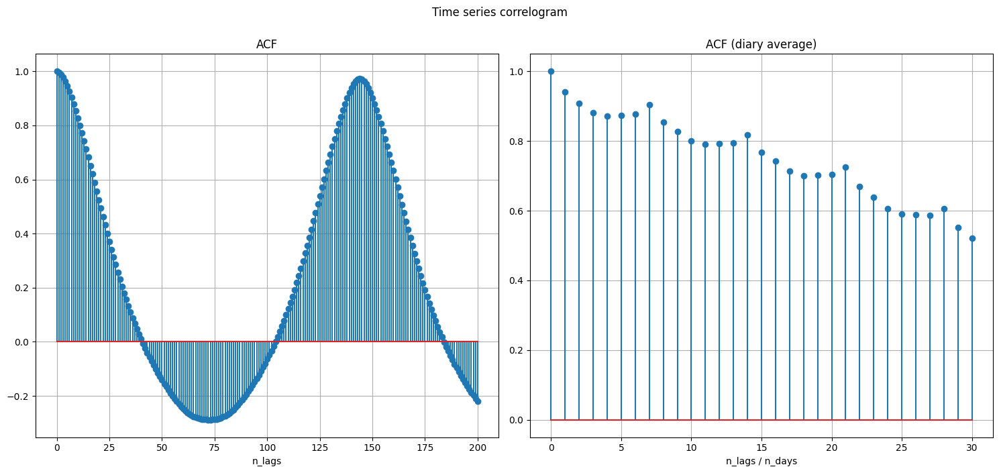

In [55]:
fas_d = sm.tsa.acf(y, nlags=200)
fas_s = sm.tsa.acf(y.resample('D').mean(), nlags=30)

fig, axs = plt.subplots(1, 2, figsize=(15,7))
fig.suptitle('Time series correlogram', y=1)
axs[0].stem(fas_d)
axs[0].set_title('ACF')
axs[0].set_xlabel('n_lags')
axs[0].grid(True)
axs[1].stem(fas_s)
axs[1].set_title('ACF (diary average)')
axs[1].set_xlabel('n_lags / n_days')
axs[1].grid(True)
plt.tight_layout()
plt.show()

In [59]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import statsmodels.api as sm

def plot_correlogram(y):
    """
    Plot the correlogram of a time series using Plotly.

    Parameters:
    y (pd.Series): The time series data.
    """
    # Calculate ACF
    fas_d = sm.tsa.acf(y, nlags=200)
    fas_s = sm.tsa.acf(y.resample('D').mean(), nlags=30)

    # Create subplots
    fig = make_subplots(rows=1, cols=2, subplot_titles=('ACF', 'ACF (diary average)'))

    # Plot ACF with markers and lines to x-axis
    for i in range(len(fas_d)):
        fig.add_trace(go.Scatter(
            x=[i, i],
            y=[0, fas_d[i]],
            mode='lines',
            line=dict(color='green'),
            showlegend=False
        ), row=1, col=1)
    fig.add_trace(go.Scatter(
        x=list(range(len(fas_d))),
        y=fas_d,
        mode='markers',
        marker=dict(color='green'),
        showlegend=False
    ), row=1, col=1)

    # Plot ACF (diary average) with markers and lines to x-axis
    for i in range(len(fas_s)):
        fig.add_trace(go.Scatter(
            x=[i, i],
            y=[0, fas_s[i]],
            mode='lines',
            line=dict(color='orange'),
            showlegend=False
        ), row=1, col=2)
    fig.add_trace(go.Scatter(
        x=list(range(len(fas_s))),
        y=fas_s,
        mode='markers',
        marker=dict(color='orange'),
        showlegend=False
    ), row=1, col=2)

    # Update layout
    fig.update_layout(
        title='Time series correlogram',
        height=600,
        width=1000
    )

    fig.update_xaxes(title_text='n_lags', row=1, col=1)
    fig.update_xaxes(title_text='n_lags / n_days', row=1, col=2)

    fig.update_yaxes(title_text='ACF', row=1, col=1)
    fig.update_yaxes(title_text='ACF', row=1, col=2)

    fig.show()


In [57]:
plot_correlogram(y)